# Post train with GRPO on HypoSpace benchmark

[TOC]
- Prepare dataset
- Define reward function

In [1]:
# Import modules
import sys
sys.path.append("..")
from pathlib import Path
from bench.boolean.boolean_benchmark import BooleanBenchmarkRefined
from bench.boolean.boolean_dataset import BooleanObservation
import re
from datasets import load_dataset, Dataset
from trl import GRPOConfig, GRPOTrainer
from collections import defaultdict
from typing import List, Dict
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch
import ast

INFO 11-02 16:21:14 [__init__.py:216] Automatically detected platform cuda.


In [2]:
# Global variables
DATASET_DIR = "../bench/boolean/datasets/boolean_2var.json"
CONFIG_DIR = "../bench/boolean/config/config_tinyllama.yaml"
BASE_URL = "http://localhost:8080/v1"
API_KEY = "sk-XXXXXXXXXXXXXXXXXXXX"
MODEL_NAME = "tinyllama"
MODEL_ID = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
TEMPERATURE = 0.7
N_SAMPLES = 30
QUERY_MULTIPLIER = 1.0
SEED = 42

output_dir = f"results/{Path(DATASET_DIR).stem}_{MODEL_NAME}.json"

# benchmark = BooleanBenchmarkRefined(DATASET_DIR)

# llm = setup_llm(
#     llm_type="openai",
#     model=MODEL_NAME,
#     api_key=API_KEY,
#     temperature=TEMPERATURE,
#     base_url=BASE_URL
# )

# obs_sets = benchmark.complete_dataset

In [3]:
def prepare_grpo_dataset(dataset_path: str, n_samples: int = 1000):
    benchmark = BooleanBenchmarkRefined(dataset_path)
    sampled_sets = benchmark.sample_observation_sets(n_samples, seed=42)
    
    dataset_entries = []
    
    for obs_set in sampled_sets:
        observations = [
            BooleanObservation(obs['inputs'], obs['output']) 
            for obs in obs_set['observations']
        ]
        
        # 获取所有ground truth表达式
        ground_truths = obs_set.get('ground_truth_expressions', [])
        gt_formulas = [gt['formula'] for gt in ground_truths]
        gt_truth_tables = {}
        gt_mechanistic_keys = set()
        
        # 保存ground truth的truth table和mechanistic key
        for gt in ground_truths:
            if 'truth_table' in gt:
                truth_table = {}
                for key_str, value in gt['truth_table'].items():
                    # 将tuple转换为字符串格式保存
                    key_tuple = ast.literal_eval(key_str)
                    truth_table[str(key_tuple)] = value
                gt_truth_tables[gt['formula']] = truth_table
            
            if 'mechanistic_key' in gt:
                mech_key = gt['mechanistic_key']
                if isinstance(mech_key, str):
                    mech_key = ast.literal_eval(mech_key)
                # 将tuple转换为字符串
                gt_mechanistic_keys.add(str(mech_key))
        
        # 基础数据字典
        entry_data = {
            "prompt": "",  # 将在下面设置
            "observation_set_id": obs_set['observation_set_id'],
            "n_observations": obs_set['n_observations'],
            "ground_truths": gt_formulas,
            "truth_tables": [{"formula": k, "table": v} for k, v in gt_truth_tables.items()],
            "mechanistic_keys": list(gt_mechanistic_keys)
        }
        
        # 1. 添加第0轮Prompt (没有Priors)
        entry_0 = entry_data.copy()
        entry_0["prompt"] = benchmark.create_prompt(observations, [])
        entry_0["prior_count"] = 0
        dataset_entries.append(entry_0)
        
        if len(gt_formulas) > 0:
            # 2. 添加带1个prior的prompt
            entry_1 = entry_data.copy()
            entry_1["prompt"] = benchmark.create_prompt(observations, [gt_formulas[0]])
            entry_1["prior_count"] = 1
            dataset_entries.append(entry_1)
            
        if len(gt_formulas) > 1:
            # 3. 添加带2个prior的prompt
            entry_2 = entry_data.copy()
            entry_2["prompt"] = benchmark.create_prompt(observations, gt_formulas[:2])
            entry_2["prior_count"] = 2
            dataset_entries.append(entry_2)

    return dataset_entries

In [4]:
# class BooleanRewardFunction:
#     def __init__(self, dataset_path: str):
#         """初始化奖励函数，加载benchmark"""
#         self.__name__ = "reward_func"
#         self.benchmark = BooleanBenchmarkRefined(dataset_path)
        
#     def __call__(self, completions: List[List[Dict]], **kwargs) -> List[float]:
#         """
#         GRPO奖励函数
        
#         Args:
#             completions: 格式为 [[{"content": "response1"}], [{"content": "response2"}], ...]
#             prompts: 对应的提示列表
#         """
#         prompts = kwargs.get("prompts", [])
        
#         rewards = []
        
#         for prompt, completion_group in zip(prompts, completions):
#             # 每个prompt对应一组completions
#             prompt_rewards = self._evaluate_completions_for_prompt(prompt, completion_group)
#             rewards.extend(prompt_rewards)
            
#         return rewards
    
# class BooleanRewardFunction:
#     def __init__(self, dataset_path: str):
#         self.__name__ = "reward_func"
#         self.benchmark = BooleanBenchmarkRefined(dataset_path)
        
#     def __call__(self, completions: List[str], prompts: List[str], **kwargs) -> List[float]:
#         """
#         GRPO奖励函数 - 接收扁平化的列表
        
#         Args:
#             completions: 格式为 ["ans1", "ans2", "ans3", ...]
#             prompts: 格式为 ["p1", "p1", "p2", ...]
#         """
#         rewards = []
        
#         # 从kwargs中获取与prompts/completions对应的observation_set_id
#         # 你必须确保在创建Dataset时保留了此列
#         observation_set_ids = kwargs.get("observation_set_id", [None] * len(prompts))
#         if len(observation_set_ids) != len(prompts):
#              # 这是一个备用方案，如果kwargs没有正确传递列表
#              observation_set_ids = [None] * len(prompts)
             
#         for prompt, content, obs_id in zip(prompts, completions, observation_set_ids):
            
#             # --- 1. 从Prompt中提取观测值 ---
#             # （注意：如果obs_id可用，从benchmark加载GTs会更高效）
#             observations = self._extract_observations_from_prompt(prompt)
#             if not observations:
#                 rewards.append(-1.0) # 惩罚无法解析的prompt
#                 continue
            
#             # --- 2. 解析和验证 ---
#             expr_str = self.benchmark.parse_llm_response(content)
#             if not expr_str:
#                 rewards.append(-0.5) # 惩罚无法解析的回答
#                 continue
            
#             is_valid, _ = self.benchmark.validate_expression(expr_str, observations)
            
#             if is_valid:
#                 valid_reward = 1.0
#                 depth = self.benchmark.get_expression_depth(expr_str)
#                 complexity_reward = self._compute_complexity_reward(depth)
                
#                 # TODO: 增加 recovery_reward
#                 # recovery_reward = self._check_recovery(expr_str, obs_id)
                
#                 total_reward = valid_reward + complexity_reward # + recovery_reward
#             else:
#                 total_reward = -0.5 # 惩罚无效表达式
                
#             rewards.append(total_reward)
            
#         return rewards

#     def _evaluate_completions_for_prompt(self, prompt: str, completions: List[Dict]) -> List[float]:
#         """评估单个prompt对应的所有completions"""

#         # 从prompt中提取observations (需要解析prompt内容)
#         observations = self._extract_observations_from_prompt(prompt)
#         if not observations:
#             return [0.0] * len(completions)
        
#         rewards = []
#         valid_expressions = []
#         mechanistic_keys = set()
        
#         for completion in completions:
#             content = completion[0]["content"] if completion and isinstance(completion, list) else str(completion)
            
#             # 解析LLM响应
#             expr_str = self.benchmark.parse_llm_response(content)
#             if not expr_str:
#                 rewards.append(0.0)
#                 continue
            
#             # 验证表达式
#             is_valid, truth_table = self.benchmark.validate_expression(expr_str, observations)
            
#             if is_valid:
#                 # 有效性奖励
#                 valid_reward = 1.0
                
#                 # 独特性奖励 - 基于mechanistic key
#                 mech_key = self.benchmark.get_expression_mechanistic_key(expr_str)
#                 if mech_key and mech_key not in mechanistic_keys:
#                     uniqueness_reward = 1.0
#                     mechanistic_keys.add(mech_key)
#                 else:
#                     uniqueness_reward = 0.1  # 小的奖励给重复但有效的表达式
                
#                 # 复杂度奖励 (鼓励适中的复杂度)
#                 depth = self.benchmark.get_expression_depth(expr_str)
#                 complexity_reward = self._compute_complexity_reward(depth)
                
#                 total_reward = valid_reward + uniqueness_reward + complexity_reward
#                 valid_expressions.append(expr_str)
                
#             else:
#                 # 无效表达式的惩罚
#                 total_reward = -0.5
                
#             rewards.append(total_reward)
        
#         # 如果有多个有效且独特的表达式，给予额外奖励
#         if len(mechanistic_keys) > 1:
#             for i, reward in enumerate(rewards):
#                 if reward > 0:  # 只奖励有效的表达式
#                     rewards[i] += 0.5 * (len(mechanistic_keys) - 1)
        
#         return rewards
    
#     def _extract_observations_from_prompt(self, prompt: str) -> List[BooleanObservation]:
#         """从prompt中提取observations"""
#         # 这里需要根据您的prompt格式来解析
#         # 示例解析逻辑 - 您需要根据实际的prompt格式调整
        
#         observations = []
#         lines = prompt.split('\n')
        
#         for line in lines:
#             if '->' in line and '=' in line:
#                 # 解析类似 "(x=0, y=1) -> 1" 的格式
#                 try:
#                     input_part, output_part = line.split('->')
#                     output = int(output_part.strip())
                    
#                     # 提取输入变量
#                     inputs = {}
#                     if 'x=' in input_part:
#                         x_match = re.search(r'x=(\d)', input_part)
#                         if x_match:
#                             inputs['x'] = int(x_match.group(1))
#                     if 'y=' in input_part:
#                         y_match = re.search(r'y=(\d)', input_part)
#                         if y_match:
#                             inputs['y'] = int(y_match.group(1))
                    
#                     if inputs:
#                         observations.append(BooleanObservation(inputs, output))
#                 except:
#                     continue
        
#         return observations
    
#     def _compute_complexity_reward(self, depth: int) -> float:
#         """计算复杂度奖励 - 鼓励适中复杂度"""
#         if depth == 0:
#             return 0.1  # 太简单
#         elif depth == 1:
#             return 0.3  # 适中
#         elif depth == 2:
#             return 0.5  # 较好
#         elif depth == 3:
#             return 0.4  # 稍复杂
#         else:
#             return 0.1  # 太复杂

In [5]:
class BooleanRewardFunction:
    def __init__(self, dataset_path: str):
        self.__name__ = "reward_func"
        self.benchmark = BooleanBenchmarkRefined(dataset_path)

    def __call__(self, completions: List[str], prompts: List[str], **kwargs) -> List[float]:
        """
        GRPO奖励函数
        Args:
            completions: 每个completion是一个生成的表达式
            prompts: 对应的prompt列表
            kwargs: 额外参数，包含数据集信息
        Returns:
            每个completion的奖励分数列表
        """
        rewards = []
        # 获取数据集信息
        gt_lists = kwargs.get("ground_truths", [[]] * len(prompts))
        gt_tables = kwargs.get("truth_tables", [{}] * len(prompts))
        gt_mech_keys = kwargs.get("mechanistic_keys", [[]] * len(prompts))
        
        for completion, prompt, gts, tables, mech_keys in zip(
            completions, prompts, gt_lists, gt_tables, gt_mech_keys
        ):
            reward_components = self._compute_rewards(completion, prompt, gts, tables, mech_keys)
            rewards.append(sum(reward_components.values()))
            
        return rewards

    def _compute_rewards(self, completion: str, prompt: str, 
                        ground_truths: List[str], truth_tables: List[Dict], 
                        gt_mech_keys: List[str]) -> Dict[str, float]:
        """计算完整的奖励分解"""
        rewards = {
            "validity": 0.0,
            "uniqueness": 0.0,
            "complexity": 0.0,
            "recovery": 0.0,
            "simplification": 0.0
        }
        
        # 1. 提取observations
        observations = self._extract_observations_from_prompt(prompt)
        if not observations:
            rewards["validity"] = -1.0
            return rewards
            
        # 2. 解析生成的表达式
        expr_str = self.benchmark.parse_llm_response(completion)
        if not expr_str:
            rewards["validity"] = -0.5
            return rewards
            
        # 3. 验证表达式
        is_valid, truth_table = self.benchmark.validate_expression(expr_str, observations)
        if not is_valid:
            rewards["validity"] = -0.5
            return rewards
            
        # 4. 计算基础奖励
        rewards["validity"] = 1.0
        
        # 5. 计算复杂度奖励
        depth = self.benchmark.get_expression_depth(expr_str)
        rewards["complexity"] = self._compute_complexity_reward(depth)
        
        # 6. 计算与ground truth相关的奖励
        mech_key = self.benchmark.get_expression_mechanistic_key(expr_str)
        if mech_key:
            mech_key_str = str(mech_key)  # 转换为字符串以匹配数据集格式
            
            # 恢复率奖励
            if mech_key_str in gt_mech_keys:
                rewards["recovery"] = 1.0
            
            # 简化奖励
            if ground_truths and truth_tables:
                for table_info in truth_tables:
                    gt_expr = table_info["formula"]
                    if mech_key_str in gt_mech_keys and len(expr_str) < len(gt_expr):
                        rewards["simplification"] = 0.5
                        break
                        
            # 独特性奖励 (与ground truths不同)
            if mech_key_str not in gt_mech_keys:
                rewards["uniqueness"] = 0.5
        
        return rewards

    def _extract_observations_from_prompt(self, prompt: str) -> List[BooleanObservation]:
        """从prompt中提取observations"""
        observations = []
        lines = prompt.split('\n')
        
        for line in lines:
            if '->' in line and '=' in line:
                try:
                    input_part, output_part = line.split('->')
                    output = int(output_part.strip())
                    
                    inputs = {}
                    if 'x=' in input_part:
                        x_match = re.search(r'x=(\d)', input_part)
                        if x_match:
                            inputs['x'] = int(x_match.group(1))
                    if 'y=' in input_part:
                        y_match = re.search(r'y=(\d)', input_part)
                        if y_match:
                            inputs['y'] = int(y_match.group(1))
                    
                    if inputs:
                        observations.append(BooleanObservation(inputs, output))
                except:
                    continue
        
        return observations
    
    def _compute_complexity_reward(self, depth: int) -> float:
        """计算复杂度奖励 - 鼓励适中复杂度"""
        if depth == 0:
            return 0.1  # 太简单
        elif depth == 1:
            return 0.3  # 适中
        elif depth == 2:
            return 0.5  # 较好
        elif depth == 3:
            return 0.4  # 稍复杂
        else:
            return 0.1  # 太复杂

In [6]:
# 导入可视化相关的库
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from IPython.display import display
import numpy as np
from transformers import TrainerCallback

# 创建数据集
dataset_entries = prepare_grpo_dataset(DATASET_DIR, n_samples=1000)
dataset = Dataset.from_list(dataset_entries)

# 创建TensorBoard writer
writer = SummaryWriter(f"runs/grpo_{MODEL_NAME}_boolean")

model = AutoModelForCausalLM.from_pretrained(
    MODEL_ID,
    dtype=torch.float16,
    device_map="auto"
)

class CustomCallback(TrainerCallback):
    def __init__(self, writer):
        super().__init__()
        self.writer = writer
        self.step = 0
        self.reward_history = []
        self.loss_history = []
        
    def on_init_end(self, args, state, control, **kwargs):
        """在训练初始化结束时调用"""
        return control
        
    def on_step_end(self, args, state, control, rewards=None, **kwargs):
        """在每一步结束时调用"""
        if rewards is not None:
            mean_reward = np.mean(rewards)
            self.reward_history.append(mean_reward)
            self.writer.add_scalar('Reward/step', mean_reward, self.step)
            
        if state.log_history:
            latest_loss = state.log_history[-1].get('loss', None)
            if latest_loss is not None:
                self.loss_history.append(latest_loss)
                self.writer.add_scalar('Loss/step', latest_loss, self.step)
                
        # 每100步绘制一次图表
        if self.step % 100 == 0 and self.step > 0:
            self._plot_training_progress()
            
        self.step += 1
        return control
        
    def on_train_end(self, args, state, control, **kwargs):
        """在训练结束时调用"""
        self._plot_training_progress()
        return control
        
    def _plot_training_progress(self):
        """绘制训练进度图"""
        plt.figure(figsize=(12, 4))
        
        # 绘制奖励
        plt.subplot(1, 2, 1)
        plt.plot(self.reward_history)
        plt.title('Mean Reward vs Steps')
        plt.xlabel('Step')
        plt.ylabel('Mean Reward')
        
        # 绘制损失
        plt.subplot(1, 2, 2)
        plt.plot(self.loss_history)
        plt.title('Loss vs Steps')
        plt.xlabel('Step')
        plt.ylabel('Loss')
        
        plt.tight_layout()
        display(plt.gcf())
        plt.close()

trainer_args = GRPOConfig(
    output_dir=f"grpo_{MODEL_NAME}_boolean",
    learning_rate=5e-6,
    per_device_train_batch_size=4,
    gradient_accumulation_steps=4,
    num_train_epochs=1,
    max_completion_length=512,
    max_prompt_length=256,
    use_vllm=True,
    vllm_mode="colocate",
    log_completions=True,
    logging_steps=10,  # 每10步记录一次日志
    eval_strategy="steps",  # 按步数进行评估
    eval_steps=100,  # 每100步评估一次
    save_strategy="steps",  # 按步数保存
    save_steps=100,  # 每100步保存一次
    load_best_model_at_end=True,  # 在训练结束时加载最佳模型
    metric_for_best_model="reward",  # 使用reward作为最佳模型的度量
    greater_is_better=True  # reward越大越好
)

reward_function = BooleanRewardFunction(DATASET_DIR)
callback = CustomCallback(writer)

trainer = GRPOTrainer(
    model=model,
    reward_funcs=reward_function,
    args=trainer_args,
    train_dataset=dataset,
    eval_dataset=dataset,
    callbacks=[callback]
)

Loaded complete dataset with 35 observation sets
Variables: x, y
Operators: OR, AND
Max depth: 2
Loaded complete dataset with 35 observation sets
Variables: x, y
Operators: OR, AND
Max depth: 2
Loaded complete dataset with 35 observation sets
Variables: x, y
Operators: OR, AND
Max depth: 2


The model is already on multiple devices. Skipping the move to device specified in `args`.


INFO 11-02 16:21:25 [utils.py:328] non-default args: {'seed': 0, 'max_model_len': 768, 'distributed_executor_backend': 'external_launcher', 'gpu_memory_utilization': 0.3, 'max_num_batched_tokens': 4096, 'max_num_seqs': 16, 'logprobs_mode': 'processed_logprobs', 'disable_log_stats': True, 'model_impl': 'vllm', 'model': 'TinyLlama/TinyLlama-1.1B-Chat-v1.0'}
INFO 11-02 16:21:35 [__init__.py:742] Resolved architecture: LlamaForCausalLM
INFO 11-02 16:21:35 [__init__.py:742] Resolved architecture: LlamaForCausalLM


`torch_dtype` is deprecated! Use `dtype` instead!


INFO 11-02 16:21:35 [__init__.py:1815] Using max model len 768
INFO 11-02 16:21:40 [parallel.py:348] Disabling V1 multiprocessing for external launcher.
INFO 11-02 16:21:40 [parallel.py:348] Disabling V1 multiprocessing for external launcher.
INFO 11-02 16:21:41 [scheduler.py:222] Chunked prefill is enabled with max_num_batched_tokens=4096.
INFO 11-02 16:21:41 [scheduler.py:222] Chunked prefill is enabled with max_num_batched_tokens=4096.
INFO 11-02 16:21:44 [core.py:76] Initializing a V1 LLM engine (v0.10.2) with config: model='TinyLlama/TinyLlama-1.1B-Chat-v1.0', speculative_config=None, tokenizer='TinyLlama/TinyLlama-1.1B-Chat-v1.0', skip_tokenizer_init=False, tokenizer_mode=auto, revision=None, tokenizer_revision=None, trust_remote_code=False, dtype=torch.bfloat16, max_seq_len=768, download_dir=None, load_format=auto, tensor_parallel_size=1, pipeline_parallel_size=1, data_parallel_size=1, disable_custom_all_reduce=False, quantization=None, enforce_eager=False, kv_cache_dtype=auto, 

[W1102 16:21:46.013436165 ProcessGroupNCCL.cpp:981] Warning: TORCH_NCCL_AVOID_RECORD_STREAMS is the default now, this environment variable is thus deprecated. (function operator())


[Gloo] Rank 0 is connected to 0 peer ranks. Expected number of connected peer ranks is : 0
[Gloo] Rank 0 is connected to 0 peer ranks. Expected number of connected peer ranks is : 0
[Gloo] Rank 0 is connected to 0 peer ranks. Expected number of connected peer ranks is : 0
[Gloo] Rank 0 is connected to 0 peer ranks. Expected number of connected peer ranks is : 0
[Gloo] Rank 0 is connected to 0 peer ranks. Expected number of connected peer ranks is : 0
[Gloo] Rank 0 is connected to 0 peer ranks. Expected number of connected peer ranks is : 0
INFO 11-02 16:21:47 [parallel_state.py:1165] rank 0 in world size 1 is assigned as DP rank 0, PP rank 0, TP rank 0, EP rank 0
[Gloo] Rank 0 is connected to 0 peer ranks. Expected number of connected peer ranks is : 0
INFO 11-02 16:21:47 [parallel_state.py:1165] rank 0 in world size 1 is assigned as DP rank 0, PP rank 0, TP rank 0, EP rank 0
INFO 11-02 16:21:47 [gpu_model_runner.py:2338] Starting to load model TinyLlama/TinyLlama-1.1B-Chat-v1.0...
INF

Loading safetensors checkpoint shards:   0% Completed | 0/1 [00:00<?, ?it/s]


INFO 11-02 16:21:55 [default_loader.py:268] Loading weights took 0.79 seconds
INFO 11-02 16:21:56 [gpu_model_runner.py:2392] Model loading took 2.0513 GiB and 8.168086 seconds
INFO 11-02 16:21:56 [gpu_model_runner.py:2392] Model loading took 2.0513 GiB and 8.168086 seconds
INFO 11-02 16:22:00 [backends.py:539] Using cache directory: /home/xmy/.cache/vllm/torch_compile_cache/1e216bee26/rank_0_0/backbone for vLLM's torch.compile
INFO 11-02 16:22:00 [backends.py:550] Dynamo bytecode transform time: 3.96 s
INFO 11-02 16:22:00 [backends.py:539] Using cache directory: /home/xmy/.cache/vllm/torch_compile_cache/1e216bee26/rank_0_0/backbone for vLLM's torch.compile
INFO 11-02 16:22:00 [backends.py:550] Dynamo bytecode transform time: 3.96 s
INFO 11-02 16:22:01 [backends.py:161] Directly load the compiled graph(s) for dynamic shape from the cache, took 1.333 s
INFO 11-02 16:22:01 [backends.py:161] Directly load the compiled graph(s) for dynamic shape from the cache, took 1.333 s
INFO 11-02 16:22

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 7/7 [00:00<00:00, 25.62it/s]
Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 7/7 [00:00<00:00, 25.62it/s]


INFO 11-02 16:22:05 [gpu_model_runner.py:3118] Graph capturing finished in 1 secs, took 0.08 GiB
INFO 11-02 16:22:05 [gpu_worker.py:391] Free memory on device (4.73/8.0 GiB) on startup. Desired GPU memory utilization is (0.3, 2.4 GiB). Actual usage is 2.05 GiB for weight, 0.2 GiB for peak activation, 0.02 GiB for non-torch memory, and 0.08 GiB for CUDAGraph memory. Replace gpu_memory_utilization config with `--kv-cache-memory=-101057536` to fit into requested memory, or `--kv-cache-memory=2405825536` to fully utilize gpu memory. Current kv cache memory in use is 142212096 bytes.
INFO 11-02 16:22:05 [gpu_worker.py:391] Free memory on device (4.73/8.0 GiB) on startup. Desired GPU memory utilization is (0.3, 2.4 GiB). Actual usage is 2.05 GiB for weight, 0.2 GiB for peak activation, 0.02 GiB for non-torch memory, and 0.08 GiB for CUDAGraph memory. Replace gpu_memory_utilization config with `--kv-cache-memory=-101057536` to fit into requested memory, or `--kv-cache-memory=2405825536` to fu

The tokenizer has new PAD/BOS/EOS tokens that differ from the model config and generation config. The model config and generation config were aligned accordingly, being updated with the tokenizer's values. Updated tokens: {'pad_token_id': 2}.


INFO 11-02 16:22:23 [block_pool.py:292] Successfully reset prefix cache


/home/xmy/academic/senoir1/ml/creative-llm/.venv/lib64/python3.13/site-packages/torch/utils/checkpoint.py:85: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


Step,Training Loss,Validation Loss


INFO 11-02 16:24:25 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:27:42 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:27:42 [block_pool.py:292] Successfully reset prefix cache


/home/xmy/academic/senoir1/ml/creative-llm/.venv/lib64/python3.13/site-packages/torch/utils/checkpoint.py:85: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


INFO 11-02 16:32:07 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:36:33 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:36:33 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:39:56 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:39:56 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:44:27 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:44:27 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:47:20 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:47:20 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:49:56 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:49:56 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:52:38 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:52:38 [block_pool.py:292] Successfully reset prefix cache


╭──────────────────────────────────────────────────── Step 10 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                  ┃ Completion                              ┃ reward_func ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ or De Morgan normalization: mixing      │ AND and and and and and and and and and │       -0.50 │      0.00 │ │
│ │ operators keeps expressions DIFFERENT   │ and and and and and and and and usage   │             │           │ │
│ │ (e.g., (x AND y) OR z ≠ x AND (y OR     │ AND and and and and and and and and and │             │           │ │
│ │ z)).                                    │ and usage AND and and and and and and   │             │           │ │
│ │             5. Expression depth should  │ and and and and and and and and and and │             │           │ │
│ │ be at most 2 levels of nesting          │ and and and and and and and and and and │             │           │ │
│ │             6. Do not use boolean       │ and and and and and and and and and and │             │           │ │
│ │ constants True or False anywhere in the │ and and and and and and and and and and │             │           │ │
│ │ expression.                             │ and and and and and and and and and and │             │           │ │
│ │                                         │ and and and and and usage AND and and   │             │           │ │
│ │             Output format:              │ and and and and and and and and and and │             │           │ │
│ │             - Return ONLY the Boolean   │ and and and and and and and and and and │             │           │ │
│ │ expression on a single line             │ and and and and and and and and and and │             │           │ │
│ │             - Use plain text format (no │ and and and and and and and and and and │             │           │ │
│ │ LaTeX, no markdown, no special          │ and and and and and and and and and and │             │           │ │
│ │ formatting)                             │ and and and and and and and and and and │             │           │ │
│ │             - Use uppercase for         │ and and and and and and and and and and │             │           │ │
│ │ operators.                              │ and and and and and and and and and and │             │           │ │
│ │             - Use lowercase for         │ and and and and and and and and and and │             │           │ │
│ │ variables: x, y                         │ and and and and and and and usage and   │             │           │ │
│ │             - Use parentheses for       │ usage and and and and and and and and   │             │           │ │
│ │ grouping when needed                    │ and and and and and and and and and and │             │           │ │
│ │             - Start your response with  │ and and and and and and and and and and │             │           │ │
│ │ "Expression: " followed by the          │ and and and and and and and and and and │             │           │ │
│ │ expression                              │ and and and and and and and and and and │             │           │ │
│ │                                         │ and and and usage and and and and and   │             │           │ │
│ │             Examples of correct format: │ and and and and and and and and and and │             │           │ │
│ │             Expression: x AND y         │ and and and and and and usage           │             │           │ │
│ │             Expression: (x OR y) AND    │                                         │             │           │ │
│ │ NOT x                                   │                                         │             │           │ │
│ │             Expression: NOT (x AND y)   │           

INFO 11-02 16:55:01 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:56:38 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:56:38 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:58:08 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:58:08 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:59:38 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 16:59:38 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:01:41 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:01:41 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:03:55 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:03:55 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:06:00 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:06:00 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:08:05 [block_pool.py:292] Successfully reset prefi

╭──────────────────────────────────────────────────── Step 20 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                  ┃ Completion                              ┃ reward_func ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ or De Morgan normalization: mixing      │ and formatting formatting formatting    │       -0.50 │      0.00 │ │
│ │ operators keeps expressions DIFFERENT   │ formatting usage formatting usage       │             │           │ │
│ │ (e.g., (x AND y) OR z ≠ x AND (y OR     │ formatting formatting formatting        │             │           │ │
│ │ z)).                                    │ formatting formatting formatting        │             │           │ │
│ │             5. Expression depth should  │ formatting formatting formatting        │             │           │ │
│ │ be at most 2 levels of nesting          │ formatting formatting formatting        │             │           │ │
│ │             6. Do not use boolean       │ formatting formatting formatting        │             │           │ │
│ │ constants True or False anywhere in the │ formatting formatting formatting        │             │           │ │
│ │ expression.                             │ formatting formatting formatting        │             │           │ │
│ │                                         │ formatting formatting formatting        │             │           │ │
│ │             Output format:              │ formatting formatting formatting        │             │           │ │
│ │             - Return ONLY the Boolean   │ formatting formatting formatting        │             │           │ │
│ │ expression on a single line             │ formatting formatting formatting        │             │           │ │
│ │             - Use plain text format (no │ formatting formatting formatting        │             │           │ │
│ │ LaTeX, no markdown, no special          │ formatting formatting formatting        │             │           │ │
│ │ formatting)                             │ formatting formatting formatting        │             │           │ │
│ │             - Use uppercase for         │ formatting formatting formatting        │             │           │ │
│ │ operators.                              │ formatting formatting formatting        │             │           │ │
│ │             - Use lowercase for         │ formatting formatting formatting        │             │           │ │
│ │ variables: x, y                         │ formatting formatting formatting        │             │           │ │
│ │             - Use parentheses for       │ formatting formatting formatting        │             │           │ │
│ │ grouping when needed                    │ formatting formatting formatting        │             │           │ │
│ │             - Start your response with  │ formatting formatting formatting        │             │           │ │
│ │ "Expression: " followed by the          │ formatting formatting formatting        │             │           │ │
│ │ expression                              │ formatting formatting formatting        │             │           │ │
│ │                                         │ formatting formatting formatting        │             │           │ │
│ │             Examples of correct format: │ formatting formatting formatting        │             │           │ │
│ │             Expression: x AND y         │ formatting formatting formatting        │             │           │ │
│ │             Expression: (x OR y) AND    │ formatting formatting formatting        │             │           │ │
│ │ NOT x                                   │ formatting formatting formatting        │             │           │ │
│ │             Expression: NOT (x AND y)   │ formatting

INFO 11-02 17:14:54 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:17:34 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:17:34 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:20:15 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:20:15 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:22:57 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:22:57 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:25:39 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:25:39 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:28:21 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:28:21 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:31:01 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:31:01 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:33:42 [block_pool.py:292] Successfully reset prefi

╭──────────────────────────────────────────────────── Step 30 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                  ┃ Completion                              ┃ reward_func ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ or De Morgan normalization: mixing      │ formatting formatting formatting        │        1.10 │      0.00 │ │
│ │ operators keeps expressions DIFFERENT   │ formatting formatting formatting        │             │           │ │
│ │ (e.g., (x AND y) OR z ≠ x AND (y OR     │ formatting formatting formatting        │             │           │ │
│ │ z)).                                    │ formatting formatting formatting        │             │           │ │
│ │             5. Expression depth should  │ formatting formatting formatting        │             │           │ │
│ │ be at most 2 levels of nesting          │ formatting formatting formatting        │             │           │ │
│ │             6. Do not use boolean       │ formatting formatting formatting        │             │           │ │
│ │ constants True or False anywhere in the │ formatting formatting and formatting    │             │           │ │
│ │ expression.                             │ formatting formatting formatting        │             │           │ │
│ │                                         │ formatting formatting formatting        │             │           │ │
│ │             Output format:              │ formatting formatting formatting        │             │           │ │
│ │             - Return ONLY the Boolean   │ formatting formatting and formatting    │             │           │ │
│ │ expression on a single line             │ and formatting and formatting and       │             │           │ │
│ │             - Use plain text format (no │ formatting formatting formatting and    │             │           │ │
│ │ LaTeX, no markdown, no special          │ formatting formatting formatting        │             │           │ │
│ │ formatting)                             │ formatting formatting formatting        │             │           │ │
│ │             - Use uppercase for         │ formatting formatting formatting        │             │           │ │
│ │ operators.                              │ formatting and formatting formatting    │             │           │ │
│ │             - Use lowercase for         │ formatting formatting formatting        │             │           │ │
│ │ variables: x, y                         │ formatting formatting formatting        │             │           │ │
│ │             - Use parentheses for       │ formatting formatting formatting        │             │           │ │
│ │ grouping when needed                    │ formatting formatting formatting        │             │           │ │
│ │             - Start your response with  │ formatting works and formatting         │             │           │ │
│ │ "Expression: " followed by the          │ formatting formatting formatting        │             │           │ │
│ │ expression                              │ formatting formatting formatting        │             │           │ │
│ │                                         │ formatting formatting formatting        │             │           │ │
│ │             Examples of correct format: │ formatting formatting formatting        │             │           │ │
│ │             Expression: x AND y         │ formatting formatting formatting        │             │           │ │
│ │             Expression: (x OR y) AND    │ formatting formatting formatting        │             │           │ │
│ │ NOT x                                   │ formatting formatting formatting        │             │           │ │
│ │             Expression: NOT (x AND y)   │ formatting

INFO 11-02 17:41:47 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:44:27 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:44:27 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:47:09 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:47:09 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:49:50 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:49:50 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:52:33 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:52:33 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:55:13 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:55:13 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:57:18 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:57:18 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 17:59:45 [block_pool.py:292] Successfully reset prefi

╭──────────────────────────────────────────────────── Step 40 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                  ┃ Completion                              ┃ reward_func ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ or De Morgan normalization: mixing      │ formatting and formatting formatting    │       -0.50 │      0.00 │ │
│ │ operators keeps expressions DIFFERENT   │ formatting formatting and formatting    │             │           │ │
│ │ (e.g., (x AND y) OR z ≠ x AND (y OR     │ formatting formatting formatting        │             │           │ │
│ │ z)).                                    │ formatting formatting formatting        │             │           │ │
│ │             5. Expression depth should  │ formatting formatting and formatting    │             │           │ │
│ │ be at most 2 levels of nesting          │ and formatting formatting formatting    │             │           │ │
│ │             6. Do not use boolean       │ formatting formatting and formatting    │             │           │ │
│ │ constants True or False anywhere in the │ and and and formatting and formatting   │             │           │ │
│ │ expression.                             │ formatting and formatting formatting    │             │           │ │
│ │                                         │ and formatting and formatting           │             │           │ │
│ │             Output format:              │ formatting and formatting and           │             │           │ │
│ │             - Return ONLY the Boolean   │ formatting and formatting formatting    │             │           │ │
│ │ expression on a single line             │ formatting and formatting formatting    │             │           │ │
│ │             - Use plain text format (no │ formatting formatting Format formatting │             │           │ │
│ │ LaTeX, no markdown, no special          │ and formatting and formatting and       │             │           │ │
│ │ formatting)                             │ formatting formatting formatting        │             │           │ │
│ │             - Use uppercase for         │ formatting and formatting and           │             │           │ │
│ │ operators.                              │ formatting formatting formatting        │             │           │ │
│ │             - Use lowercase for         │ formatting and and formatting           │             │           │ │
│ │ variables: x, y                         │ formatting formatting formatting        │             │           │ │
│ │             - Use parentheses for       │ formatting formatting formatting        │             │           │ │
│ │ grouping when needed                    │ formatting formatting and formatting    │             │           │ │
│ │             - Start your response with  │ formatting formatting formatting        │             │           │ │
│ │ "Expression: " followed by the          │ formatting formatting formatting        │             │           │ │
│ │ expression                              │ formatting formatting formatting        │             │           │ │
│ │                                         │ formatting formatting formatting        │             │           │ │
│ │             Examples of correct format: │ formatting formatting formatting        │             │           │ │
│ │             Expression: x AND y         │ formatting and and formatting           │             │           │ │
│ │             Expression: (x OR y) AND    │ formatting and formatting formatting    │             │           │ │
│ │ NOT x                                   │ formatting formatting formatting        │             │           │ │
│ │             Expression: NOT (x AND y)   │ formatting

INFO 11-02 18:06:18 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:08:29 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:08:29 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:10:45 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:10:45 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:12:57 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:12:57 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:15:09 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:15:09 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:17:22 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:17:22 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:19:34 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:19:34 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:21:55 [block_pool.py:292] Successfully reset prefi

╭──────────────────────────────────────────────────── Step 50 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                  ┃ Completion                              ┃ reward_func ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ or De Morgan normalization: mixing      │ formatting and formatting formatting    │       -0.50 │      0.00 │ │
│ │ operators keeps expressions DIFFERENT   │ formatting usage and formatting         │             │           │ │
│ │ (e.g., (x AND y) OR z ≠ x AND (y OR     │ formatting formatting formatting        │             │           │ │
│ │ z)).                                    │ formatting formatting formatting        │             │           │ │
│ │             5. Expression depth should  │ formatting formatting and ( formatting  │             │           │ │
│ │ be at most 2 levels of nesting          │ and formatting formatting formatting    │             │           │ │
│ │             6. Do not use boolean       │ formatting and formatting and and and   │             │           │ │
│ │ constants True or False anywhere in the │ formatting and formatting formatting    │             │           │ │
│ │ expression.                             │ and formatting formatting and           │             │           │ │
│ │                                         │ formatting and formatting formatting    │             │           │ │
│ │             Output format:              │ and formatting and formatting and       │             │           │ │
│ │             - Return ONLY the Boolean   │ formatting formatting formatting and    │             │           │ │
│ │ expression on a single line             │ formatting formatting formatting        │             │           │ │
│ │             - Use plain text format (no │ formatting formatting formatting and    │             │           │ │
│ │ LaTeX, no markdown, no special          │ formatting and formatting and           │             │           │ │
│ │ formatting)                             │ formatting formatting formatting        │             │           │ │
│ │             - Use uppercase for         │ formatting and formatting formatting    │             │           │ │
│ │ operators.                              │ formatting formatting formatting        │             │           │ │
│ │             - Use lowercase for         │ formatting formatting and formatting    │             │           │ │
│ │ variables: x, y                         │ formatting formatting formatting        │             │           │ │
│ │             - Use parentheses for       │ formatting formatting formatting        │             │           │ │
│ │ grouping when needed                    │ formatting formatting and formatting    │             │           │ │
│ │             - Start your response with  │ formatting formatting formatting        │             │           │ │
│ │ "Expression: " followed by the          │ formatting formatting formatting        │             │           │ │
│ │ expression                              │ formatting formatting formatting        │             │           │ │
│ │                                         │ formatting formatting formatting        │             │           │ │
│ │             Examples of correct format: │ formatting formatting formatting        │             │           │ │
│ │             Expression: x AND y         │ formatting and and formatting           │             │           │ │
│ │             Expression: (x OR y) AND    │ formatting and formatting formatting    │             │           │ │
│ │ NOT x                                   │ formatting formatting formatting        │             │           │ │
│ │             Expression: NOT (x AND y)   │ formatting

INFO 11-02 18:39:22 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:41:33 [block_pool.py:292] Successfully reset prefix cache
INFO 11-02 18:41:33 [block_pool.py:292] Successfully reset prefix cache


╭──────────────────────────────────────────────────── Step 52 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                  ┃ Completion                              ┃ reward_func ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ or De Morgan normalization: mixing      │ formatting and formatting formatting    │        1.10 │      0.00 │ │
│ │ operators keeps expressions DIFFERENT   │ formatting formatting formatting and    │             │           │ │
│ │ (e.g., (x AND y) OR z ≠ x AND (y OR     │ formatting formatting formatting        │             │           │ │
│ │ z)).                                    │ formatting formatting formatting        │             │           │ │
│ │             5. Expression depth should  │ formatting formatting and ( formatting  │             │           │ │
│ │ be at most 2 levels of nesting          │ and formatting formatting formatting    │             │           │ │
│ │             6. Do not use boolean       │ formatting and formatting and and and   │             │           │ │
│ │ constants True or False anywhere in the │ formatting and formatting Format        │             │           │ │
│ │ expression.                             │ formatting formatting Format and        │             │           │ │
│ │                                         │ formatting and formatting formatting    │             │           │ │
│ │             Output format:              │ and formatting and formatting and       │             │           │ │
│ │             - Return ONLY the Boolean   │ formatting Format formatting and        │             │           │ │
│ │ expression on a single line             │ formatting formatting formatting        │             │           │ │
│ │             - Use plain text format (no │ formatting  and formatting and          │             │           │ │
│ │ LaTeX, no markdown, no special          │ formatting and formatting formatting    │             │           │ │
│ │ formatting)                             │ formatting formatting formatting and    │             │           │ │
│ │             - Use uppercase for         │ formatting formatting formatting        │             │           │ │
│ │ operators.                              │ formatting formatting formatting        │             │           │ │
│ │             - Use lowercase for         │ formatting and formatting formatting    │             │           │ │
│ │ variables: x, y                         │ formatting formatting formatting        │             │           │ │
│ │             - Use parentheses for       │ formatting formatting formatting        │             │           │ │
│ │ grouping when needed                    │ formatting formatting formatting        │             │           │ │
│ │             - Start your response with  │ formatting formatting formatting        │             │           │ │
│ │ "Expression: " followed by the          │ formatting formatting formatting        │             │           │ │
│ │ expression                              │ formatting formatting formatting        │             │           │ │
│ │                                         │ formatting formatting formatting        │             │           │ │
│ │             Examples of correct format: │ formatting formatting formatting usage  │             │           │ │
│ │             Expression: x AND y         │ formatting and formatting formatting    │             │           │ │
│ │             Expression: (x OR y) AND    │ and formatting formatting formatting    │             │           │ │
│ │ NOT x                                   │ formatting formatting formatting        │             │           │ │
│ │             Expression: NOT (x AND y)   │ formatting

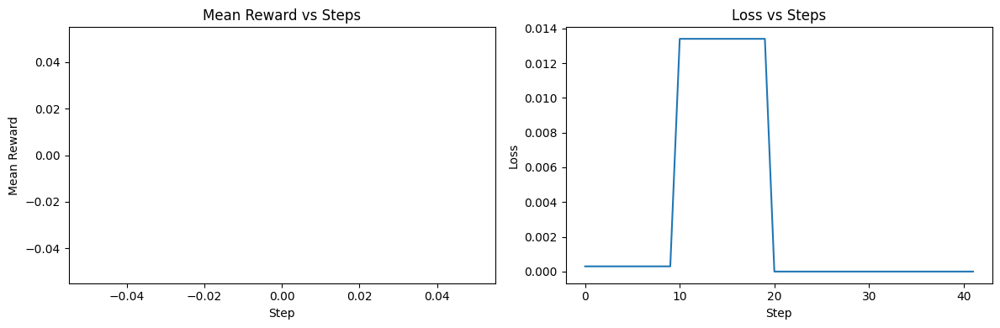

TrainOutput(global_step=52, training_loss=0.0026426695896169315, metrics={'train_runtime': 8500.1557, 'train_samples_per_second': 0.012, 'train_steps_per_second': 0.006, 'total_flos': 0.0, 'train_loss': 0.0026426695896169315})

In [7]:
trainer.train()

In [19]:
def evaluate_trained_model(model_path: str, dataset_path: str):
    """评估训练后的模型"""
    
    # 加载训练后的模型
    trained_model = AutoModelForCausalLM.from_pretrained(model_path)
    tokenizer = AutoTokenizer.from_pretrained(model_path)
    
    # 设置LLM接口
    class TrainedModelLLM:
        def __init__(self, model, tokenizer):
            self.model = model
            self.tokenizer = tokenizer
            
        def query(self, prompt):
            inputs = self.tokenizer(prompt, return_tensors="pt", truncation=True, max_length=512)
            with torch.no_grad():
                outputs = self.model.generate(
                    **inputs,
                    max_new_tokens=100,
                    temperature=0.7,
                    do_sample=True,
                    pad_token_id=self.tokenizer.eos_token_id
                )
            response = self.tokenizer.decode(outputs[0], skip_special_tokens=True)
            print(response)
            return response.split("Expression:")[-1].strip()  # 提取表达式部分
            
        def get_name(self):
            return "trained_tinyllama"
    
    llm = TrainedModelLLM(trained_model, tokenizer)
    benchmark = BooleanBenchmarkRefined(dataset_path)
    
    # 运行benchmark评估
    results = benchmark.run_benchmark(
        llm=llm,
        n_samples=10,
        query_multiplier=1.0,
        seed=42
    )
    
    return results

In [20]:
import json

# results = evaluate_trained_model("grpo_tinyllama_boolean/checkpoint-17", DATASET_DIR)
results = evaluate_trained_model("/home/xmy/.cache/huggingface/hub/models--TinyLlama--TinyLlama-1.1B-Chat-v1.0/snapshots/fe8a4ea1ffedaf415f4da2f062534de366a451e6", DATASET_DIR)
with open("results/tinyllama.json", "w") as f:
    json.dump(results, f)


Loaded complete dataset with 35 observation sets
Variables: x, y
Operators: AND, OR
Max depth: 2

Running refined Boolean benchmark
LLM: trained_tinyllama
Sampling 10 observation sets
Queries per sample: 1.0x number of ground truths (adaptive)
Checkpoint file: checkpoints/checkpoint_trained_tinyllama_20251031_143808.json
--------------------------------------------------

Sample 1/10
  Observation set ID: n2_inputs_00_01_outputs_01
  Number of observations: 2
  Number of ground truths: 5
  Using 5 queries (1.0x 5 ground truths)
You are given partial observations of a Boolean function with variables: x, y

            Allowed operators: AND (conjunction), OR (disjunction)

            Observations (input -> output):
            (x=0, y=0) -> 0
(x=0, y=1) -> 1

            Prior expressions generated (avoid repeating any expression 
            that is equivalent under the rules below):
            None

            Task: Generate a single Boolean expression that is consistent with ALL o

In [16]:
with open("dataset.json", "w") as f:
    json.dump(dataset_entries, f)